#### The model is based on treating the 3rd juction differently as it had a random inflow of traffic.
#### This interferred with other juctions data and thus treating it differently helped in eliminating the noise and also improved the error.

# Loading the Libraries

In [1]:
import math
import numpy as np
import pandas as pd
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.cross_validation import train_test_split
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
print ("Libraries Loaded")

C:\Users\humai\Anaconda2\envs\py36\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


Libraries Loaded


# Funtion definition area
#### > Dickey Fuller test

In [2]:
from statsmodels.tsa.stattools import adfuller
def test_stationarity(timeseries):
    
    #Determing rolling statistics
    rolmean = pd.rolling_mean(timeseries, window=12)
    rolstd = pd.rolling_std(timeseries, window=12)

    #Plot rolling statistics:
    plt.figure(figsize=(125,40))
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Perform Dickey-Fuller test:
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)

# Load the Data

In [3]:
train= pd.read_csv('Data/train.csv')
test= pd.read_csv('Data/test.csv')
#sample= pd.read_csv('Data/sample_submission.csv')

### Data Watch

In [4]:
print()
print("Training dataset----------->")
print(train.head(3))
print()
print("*******************")
print("*******************")
print()
print("Testing Dataset------------>")
print(test.head(3))


Training dataset----------->
              DateTime  Junction  Vehicles           ID
0  2015-11-01 00:00:00         1        15  20151101001
1  2015-11-01 01:00:00         1        13  20151101011
2  2015-11-01 02:00:00         1        10  20151101021

*******************
*******************

Testing Dataset------------>
              DateTime  Junction           ID
0  2017-07-01 00:00:00         1  20170701001
1  2017-07-01 01:00:00         1  20170701011
2  2017-07-01 02:00:00         1  20170701021


# Data Preprocessing

In [5]:
train['ID'] = train['ID'].astype(str)
#train['Junc']= train['ID'].apply(lambda x: x[10])
train['ID'] = train['ID'].apply(lambda x: x[:4]+' '+x[4:6]+' '+x[6:8]+' '+x[8:10])
train['ID'] = train['ID'].apply(lambda x: datetime.strptime(x, '%Y %m %d %H'))


ID_test_3= test[test['Junction']==3]['ID']
ID_test_others= test[test['Junction']!=3]['ID']

test['ID'] = test['ID'].astype(str)
#test['Junc']= test['ID'].apply(lambda x: x[10])
test['ID'] = test['ID'].apply(lambda x: x[:4]+' '+x[4:6]+' '+x[6:8]+' '+x[8:10])
test['ID'] = test['ID'].apply(lambda x: datetime.strptime(x, '%Y %m %d %H'))

In [6]:
train['day'] = train['ID'].dt.weekday
train['hour'] = train['ID'].dt.hour
train['month'] = train['ID'].dt.month
train["DayCount"] = train["ID"].apply(lambda x: x.toordinal()/730000) # Scale daycount
train['Year']= train['ID'].dt.year%10


test['day'] = test['ID'].dt.weekday
test['hour'] = test['ID'].dt.hour
test['month'] = test['ID'].dt.month
test["DayCount"] = test["ID"].apply(lambda x: x.toordinal()/730000)
test['Year']= test['ID'].dt.year%10

# Visulatisation
### Perform the Dickey Fuller Test

Full Train Dataset----------->


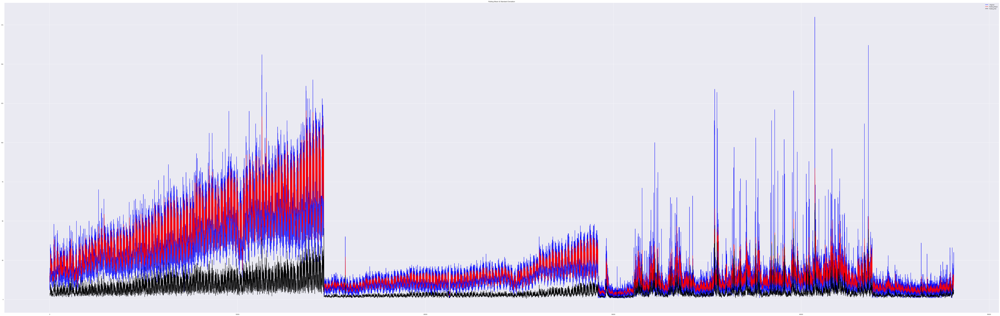

Results of Dickey-Fuller Test:
Test Statistic                -7.518278e+00
p-value                        3.851060e-11
#Lags Used                     5.700000e+01
Number of Observations Used    4.806200e+04
Critical Value (1%)           -3.430486e+00
Critical Value (5%)           -2.861600e+00
Critical Value (10%)          -2.566802e+00
dtype: float64
None
Train Dataset for Junction 1----------->


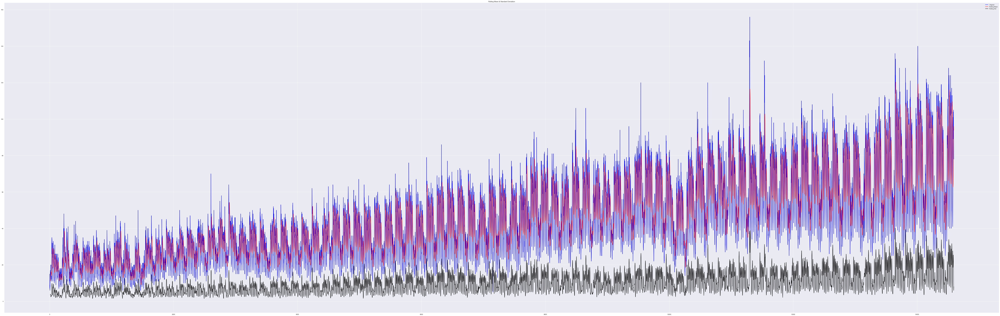

Results of Dickey-Fuller Test:
Test Statistic                -7.148078e+00
p-value                        3.193843e-10
#Lags Used                     4.200000e+01
Number of Observations Used    1.454900e+04
Critical Value (1%)           -3.430800e+00
Critical Value (5%)           -2.861739e+00
Critical Value (10%)          -2.566876e+00
dtype: float64
None
Train Dataset for Junction 2----------->


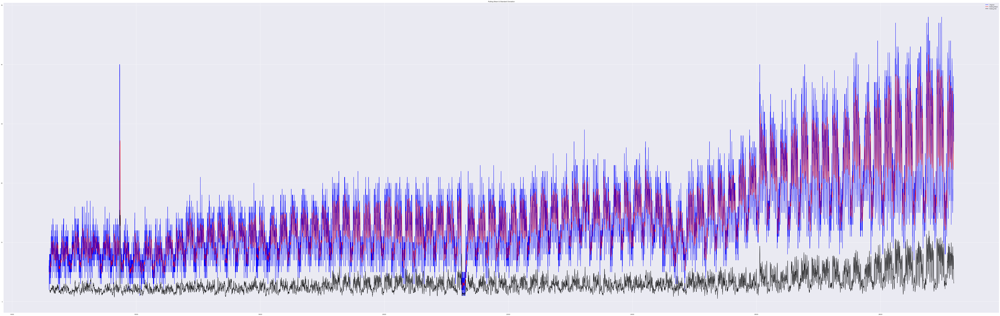

Results of Dickey-Fuller Test:
Test Statistic                -8.041077e+00
p-value                        1.846368e-12
#Lags Used                     4.200000e+01
Number of Observations Used    1.454900e+04
Critical Value (1%)           -3.430800e+00
Critical Value (5%)           -2.861739e+00
Critical Value (10%)          -2.566876e+00
dtype: float64
None
Train Dataset for Junction 3----------->


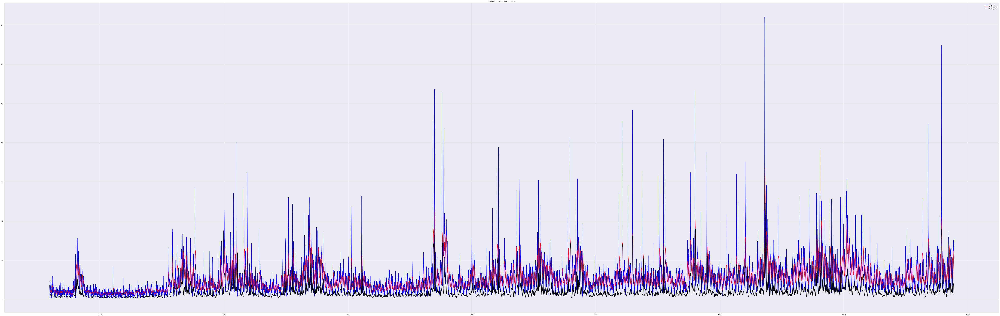

Results of Dickey-Fuller Test:
Test Statistic                -8.236600e+00
p-value                        5.867296e-13
#Lags Used                     4.200000e+01
Number of Observations Used    1.454900e+04
Critical Value (1%)           -3.430800e+00
Critical Value (5%)           -2.861739e+00
Critical Value (10%)          -2.566876e+00
dtype: float64
None
Train Dataset for Junction 4----------->


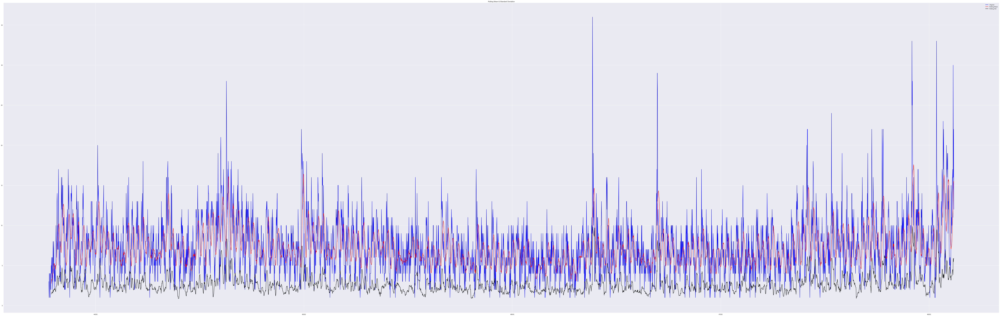

Results of Dickey-Fuller Test:
Test Statistic                -6.726732e+00
p-value                        3.374875e-09
#Lags Used                     3.000000e+01
Number of Observations Used    4.313000e+03
Critical Value (1%)           -3.431867e+00
Critical Value (5%)           -2.862210e+00
Critical Value (10%)          -2.567127e+00
dtype: float64
None


In [7]:
print ("Full Train Dataset----------->") 
print (test_stationarity(train['Vehicles']))
print ("Train Dataset for Junction 1----------->")
print (test_stationarity(train[train['Junction']==1]['Vehicles']))
print ("Train Dataset for Junction 2----------->") 
print (test_stationarity(train[train['Junction']==2]['Vehicles']))
print ("Train Dataset for Junction 3----------->") 
print (test_stationarity(train[train['Junction']==3]['Vehicles']))
print ("Train Dataset for Junction 4----------->") 
print (test_stationarity(train[train['Junction']==4]['Vehicles']))

### Drawing Self explanatory Graphs

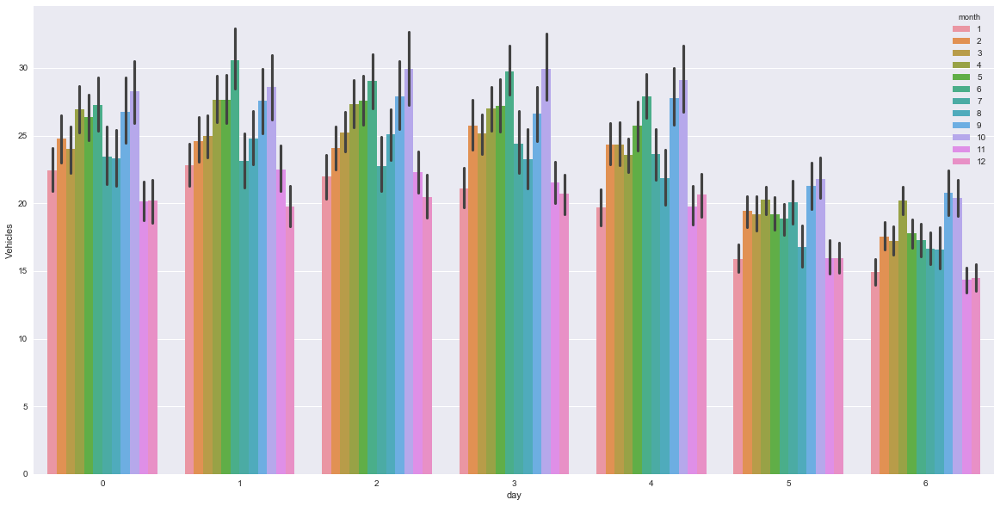

In [8]:
plt.figure(figsize=(20,10))
ax = sns.barplot(x="day", y="Vehicles", hue='month', data=train)

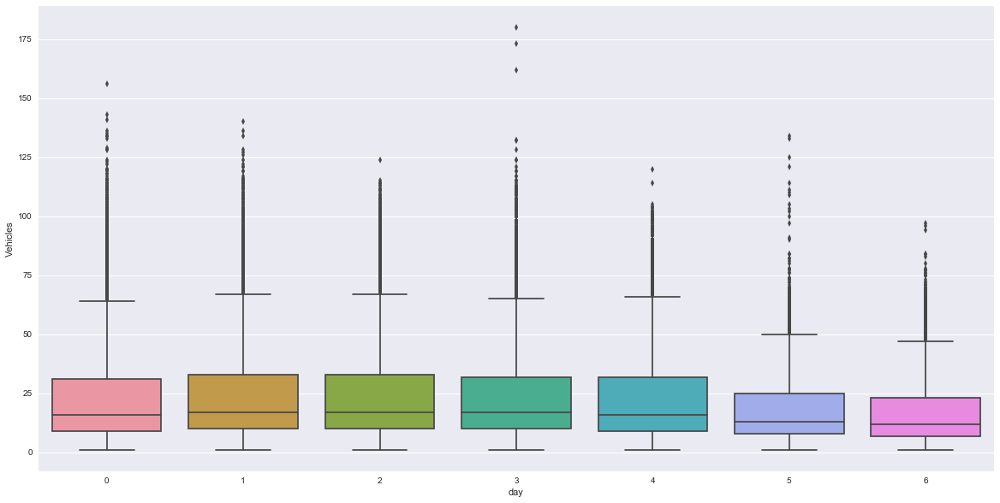

In [9]:
plt.figure(figsize=(20,10))
ax = sns.boxplot(x="day", y="Vehicles", data=train)

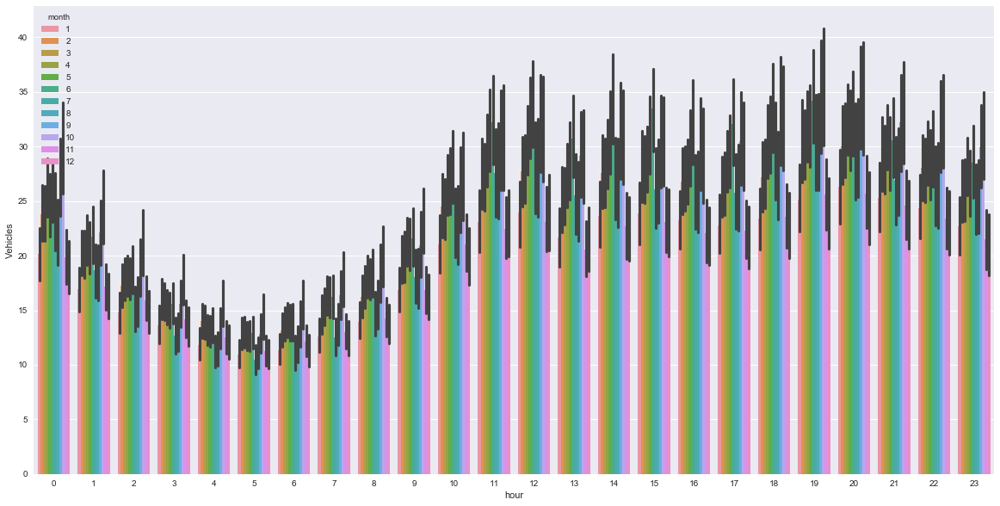

In [10]:
plt.figure(figsize=(20,10))
ax = sns.barplot(x="hour", y="Vehicles", hue='month', data=train)

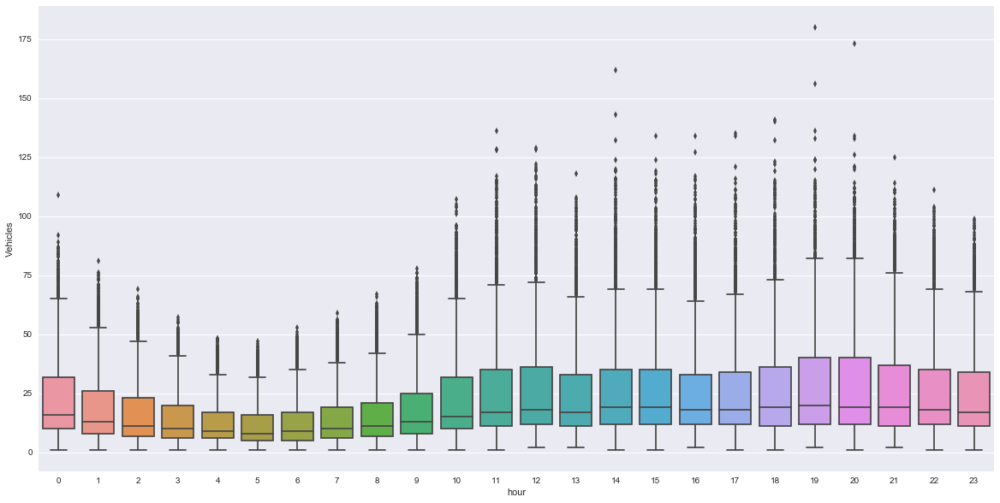

In [11]:
plt.figure(figsize=(20,10))
ax = sns.boxplot(x="hour", y="Vehicles", data=train)

### Inference from the Data Visualisation
The data is pretty periodic in the Junction 1, 2, 4. However the data seems to behave randomlly in the 3rd Juction. So the 3rd junction will be treated separately and the 1st, 2nd and the 4th juction separately. The following steps carries out the task of splitting the data.

In [12]:
test_3= test[test['Junction']==3]
test_others= test[test['Junction']!=3]

# Training the model

In [13]:
y0 = train['Vehicles']
data0 = train[['Junction', 'day', 'hour', 'month', 'DayCount','Year']]
sub_test0 = test_3[['Junction', 'day', 'hour', 'month', 'DayCount', 'Year']]

### First XGBoost is trained on the data from the juction 3 to predict the same
The model parameters which best suited the purpose are--->

n_estimators: 300    
max_depth: 6               
learning_rate: 0.005     
colsample_bytree: 1      
subsample: 1            
gamma: 0.1           
reg_alpha: 10       
min_child_weight: 4  

In [14]:
def evalerror(preds, dtrain):
    labels = dtrain.get_label()
    return 'error', math.sqrt(mean_squared_error(labels, preds))

# split data to training and validation sets
X_train, X_test, y_train, y_test = train_test_split(data0, y0, test_size=0.02, random_state=1)#28776
# convert data to Dmatrix format for xgboost
d_train = xgb.DMatrix(X_train, label=y_train)
d_valid = xgb.DMatrix(X_test, label=y_test)
d_test = xgb.DMatrix(sub_test0)

params = {  
    "n_estimators": 300 ,  
    "max_depth": 4 ,                  
    "learning_rate": 0.005 ,    
    "colsample_bytree": 1 ,     
    "subsample": 1 ,            
    "gamma": 0.1 ,              
    'reg_alpha': 10 ,           
    "min_child_weight": 4 ,     
    }

watchlist = [(d_train, 'train'), (d_valid, 'valid')]

# Train xgboost regressor
reg = xgb.train(params, d_train, 1500, watchlist,  feval = evalerror, maximize=False, verbose_eval=50)
# Predict from xgboost regressor
Vehicles_test_3 = reg.predict(d_test)

[0]	train-error:30.352	valid-error:28.3925
[50]	train-error:24.1994	valid-error:22.6706
[100]	train-error:19.4954	valid-error:18.295
[150]	train-error:15.9307	valid-error:14.9854
[200]	train-error:13.2535	valid-error:12.5217
[250]	train-error:11.2632	valid-error:10.6936
[300]	train-error:9.8011	valid-error:9.36691
[350]	train-error:8.74477	valid-error:8.42178
[400]	train-error:7.9815	valid-error:7.75661
[450]	train-error:7.44075	valid-error:7.29393
[500]	train-error:7.0539	valid-error:6.96816
[550]	train-error:6.78183	valid-error:6.73931
[600]	train-error:6.58556	valid-error:6.57631
[650]	train-error:6.43394	valid-error:6.44629
[700]	train-error:6.30375	valid-error:6.3304
[750]	train-error:6.20249	valid-error:6.23464
[800]	train-error:6.12091	valid-error:6.15431
[850]	train-error:6.04763	valid-error:6.08279
[900]	train-error:5.98773	valid-error:6.0236
[950]	train-error:5.93699	valid-error:5.97241
[1000]	train-error:5.89529	valid-error:5.92962
[1050]	train-error:5.8606	valid-error:5.894

In [15]:
y = train[train['Junction']!=3]['Vehicles']
data = train[train['Junction']!=3][['Junction', 'day', 'hour', 'month', 'DayCount','Year']]
sub_test = test_others[['Junction', 'day', 'hour', 'month', 'DayCount', 'Year']]

### Second XGBoost is trained on the data from the juction 1 ,2 ,3 to predict the same
The model parameters which best suited the purpose are--->

n_estimators: 280    
max_depth: 6               
learning_rate: 0.005     
colsample_bytree: 1      
subsample: 1            
gamma: 0.1           
reg_alpha: 10       
min_child_weight: 2

In [16]:
def evalerror(preds, dtrain):
    labels = dtrain.get_label()
    return 'error', math.sqrt(mean_squared_error(labels, preds))

# split data to training and validation sets
X_train, X_test, y_train, y_test = train_test_split(data, y, test_size=0.02, random_state=1)#28776
# convert data to Dmatrix format for xgboost
d_train = xgb.DMatrix(X_train, label=y_train)
d_valid = xgb.DMatrix(X_test, label=y_test)
d_test = xgb.DMatrix(sub_test)

params = {  
    "n_estimators": 280 ,  
    "max_depth": 3 ,              
    "learning_rate": 0.005 ,
    "colsample_bytree": 1 , 
    "subsample": 1 ,        
    "gamma": 0.1 ,              
    'reg_alpha': 1 ,   
    "min_child_weight": 2 ,     
}

watchlist = [(d_train, 'train'), (d_valid, 'valid')]

# Train xgboost regressor
reg = xgb.train(params, d_train, 1500, watchlist,  feval = evalerror, maximize=False, verbose_eval=50)
# Predict from xgboost regressor
Vehicles_test_others = reg.predict(d_test)

[0]	train-error:34.5636	valid-error:36.1821
[50]	train-error:27.6406	valid-error:29.1752
[100]	train-error:22.3883	valid-error:23.7121
[150]	train-error:18.3861	valid-error:19.4923
[200]	train-error:15.35	valid-error:16.2654
[250]	train-error:13.0494	valid-error:13.7999
[300]	train-error:11.3108	valid-error:11.929
[350]	train-error:10.0092	valid-error:10.5075
[400]	train-error:9.02971	valid-error:9.41335
[450]	train-error:8.25163	valid-error:8.55402
[500]	train-error:7.64848	valid-error:7.86611
[550]	train-error:7.17595	valid-error:7.30799
[600]	train-error:6.79819	valid-error:6.85739
[650]	train-error:6.49541	valid-error:6.49126
[700]	train-error:6.25466	valid-error:6.19895
[750]	train-error:6.05806	valid-error:5.95739
[800]	train-error:5.89407	valid-error:5.75445
[850]	train-error:5.75584	valid-error:5.58622
[900]	train-error:5.63317	valid-error:5.43861
[950]	train-error:5.52714	valid-error:5.30811
[1000]	train-error:5.43641	valid-error:5.1951
[1050]	train-error:5.36011	valid-error:5

In [17]:
# save test submission
ID= pd.DataFrame()
ID= ID_test_others.append(ID_test_3)
#Vehicles= Vehicles_test_others.concatanate(Vehicles_test_3)
Vehicles= pd.DataFrame()
Vehicles= np.concatenate((Vehicles_test_others,Vehicles_test_3))


prediction_4month = pd.DataFrame({
        "ID": ID,
        "Vehicles": Vehicles 
    })
prediction_4month.sort_values('ID')
prediction_4month.to_csv('sample_submission1.csv', index=False)